In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf

from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

In [ ]:
image_path = '/content/drive/MyDrive/23MCA0304_Dissertation_II/Dataset/Water Bodies Dataset/Images/'
mask_path = '/content/drive/MyDrive/23MCA0304_Dissertation_II/Dataset/Water Bodies Dataset/Masks/'
SIZE = 128

In [ ]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])[:]
mask_names = sorted(next(os.walk(mask_path))[-1])[:]

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 2841/2841 [00:35<00:00, 80.97it/s] 


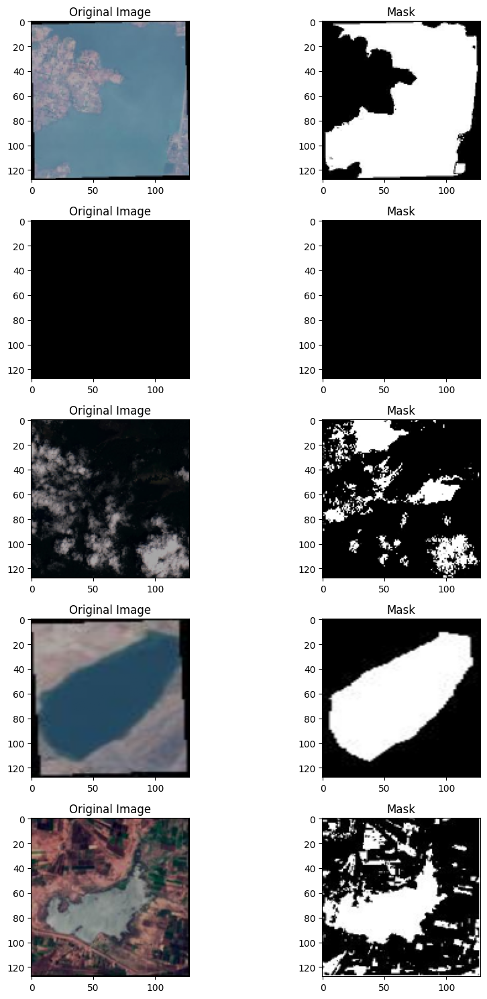

In [ ]:
# Plot some images and its masks
plt.figure(figsize=(10,15))
for i in range(1,11):
  plt.subplot(5,2,i)

  if i%2!=0:
    id = np.random.randint(len(images))
    plt.imshow(images[id], cmap=None)
    plt.title('Original Image')
  elif i%2==0:
    plt.imshow(masks[id].reshape(128,128), cmap='gray')
    plt.title('Mask')

plt.tight_layout()
plt.show()

In [ ]:
# Train test split
images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.25)

In [ ]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)

    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)

    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)

    return output_layer

In [ ]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 16)   │            448 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 16)   │          2,320 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 16)     │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 64, 64, 16)     │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 64, 64, 32)     │          4,640 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 32)     │          9,248 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 32)     │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 32, 32, 32)     │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 64)     │         18,496 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 16, 16, 64)     │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 16, 16, 64)     │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 16, 16, 128)    │         73,856 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 16, 16, 128)    │        147,584 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 8, 8, 128)      │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 8, 8, 128)      │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)    

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')

    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


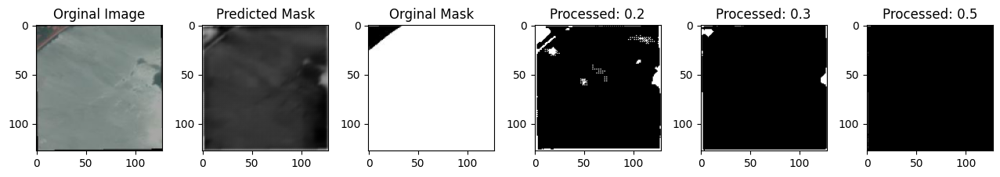

67/67 ━━━━━━━━━━━━━━━━━━━━ 51s 412ms/step - accuracy: 0.5403 - loss: 0.6186 - val_accuracy: 0.6262 - val_loss: 0.5231
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


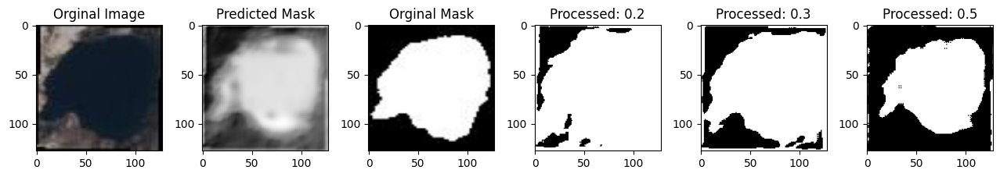

67/67 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - accuracy: 0.6320 - loss: 0.4950 - val_accuracy: 0.6420 - val_loss: 0.4859
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


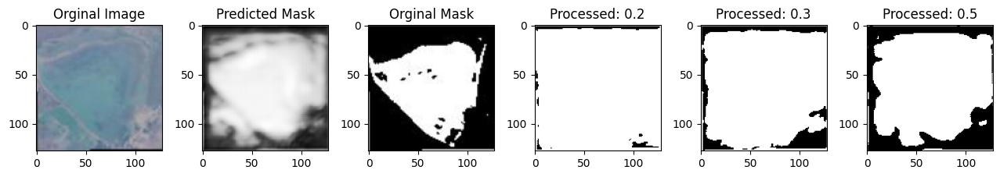

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - accuracy: 0.6558 - loss: 0.4534 - val_accuracy: 0.6560 - val_loss: 0.4664
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


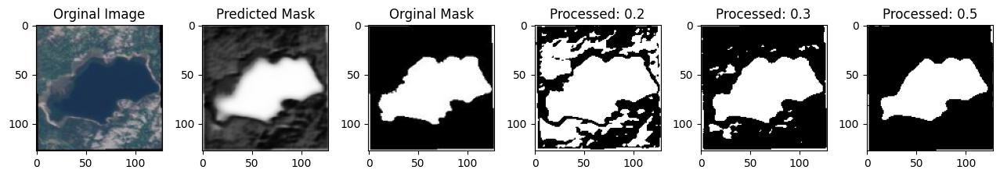

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.6744 - loss: 0.4227 - val_accuracy: 0.6258 - val_loss: 0.4853
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


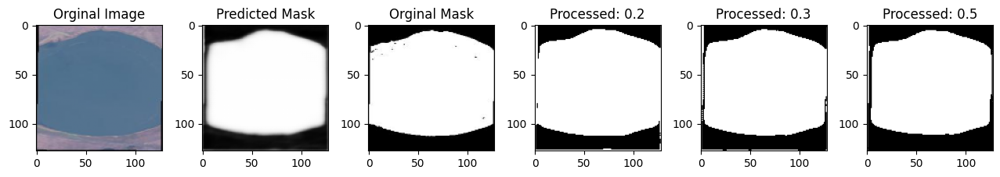

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.6652 - loss: 0.4249 - val_accuracy: 0.6781 - val_loss: 0.4114
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


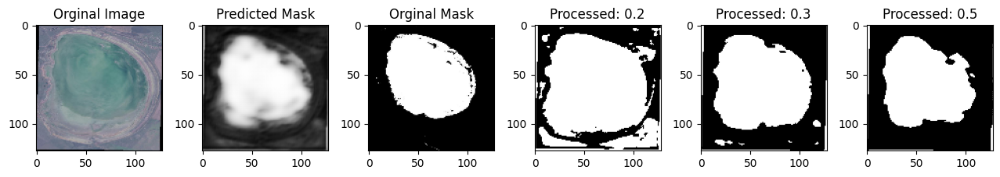

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - accuracy: 0.6849 - loss: 0.3846 - val_accuracy: 0.6810 - val_loss: 0.4073
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


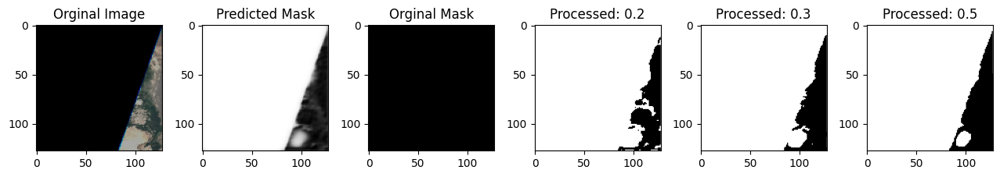

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.6781 - loss: 0.3948 - val_accuracy: 0.6912 - val_loss: 0.3729
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


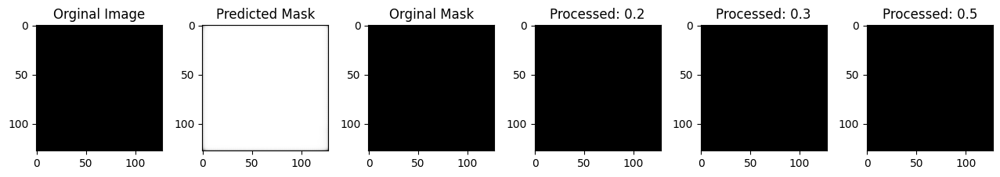

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - accuracy: 0.6985 - loss: 0.3627 - val_accuracy: 0.6948 - val_loss: 0.3681
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


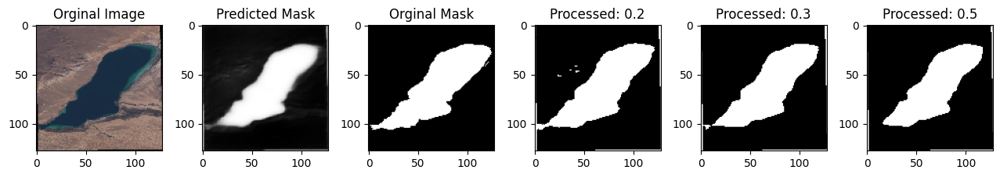

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.6890 - loss: 0.3736 - val_accuracy: 0.6907 - val_loss: 0.3833
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


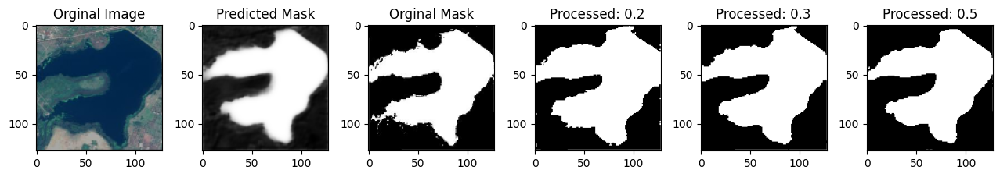

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7030 - loss: 0.3479 - val_accuracy: 0.6956 - val_loss: 0.3567
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


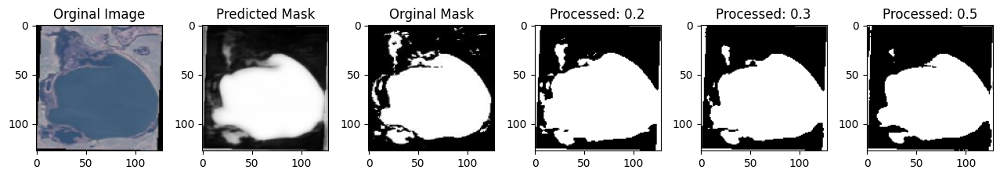

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.7077 - loss: 0.3404 - val_accuracy: 0.7061 - val_loss: 0.3379
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


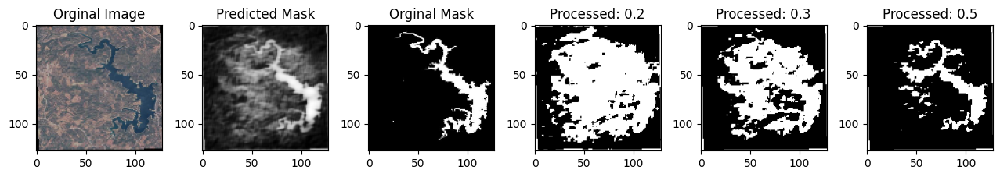

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.7128 - loss: 0.3193 - val_accuracy: 0.7083 - val_loss: 0.3362
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


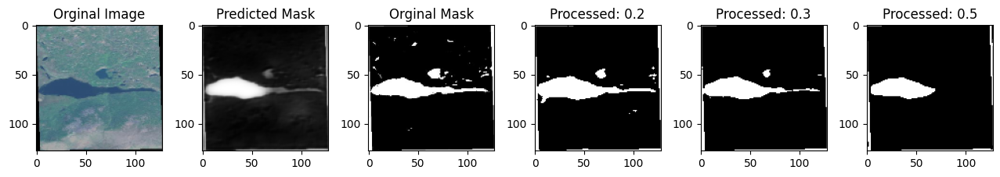

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.7156 - loss: 0.3169 - val_accuracy: 0.7183 - val_loss: 0.3179
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


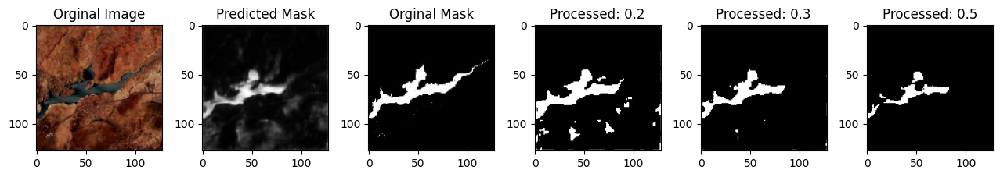

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.7120 - loss: 0.3253 - val_accuracy: 0.7150 - val_loss: 0.3131
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


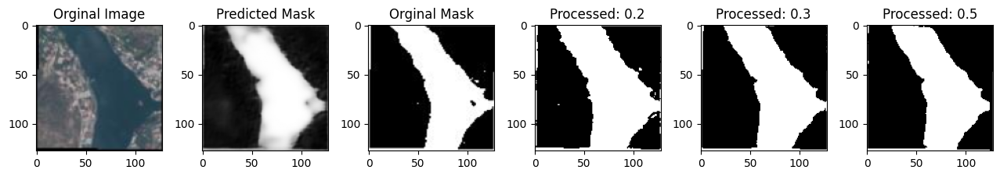

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.7128 - loss: 0.3110 - val_accuracy: 0.7096 - val_loss: 0.3312
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


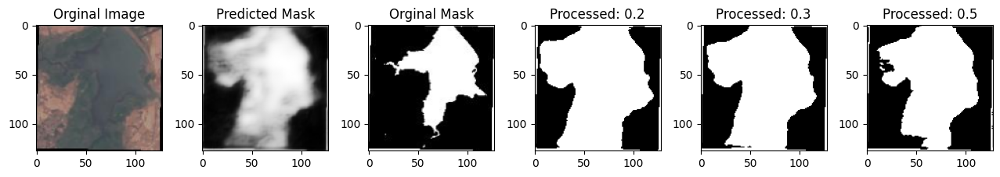

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.7069 - loss: 0.3357 - val_accuracy: 0.7162 - val_loss: 0.3124
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


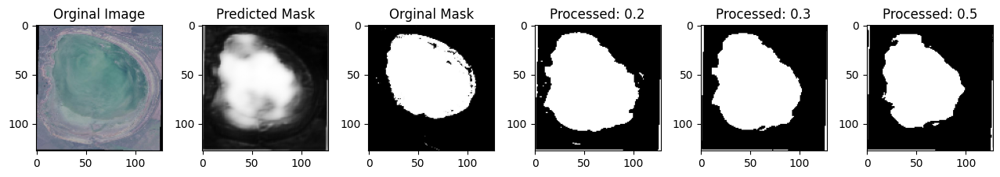

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.7202 - loss: 0.2956 - val_accuracy: 0.7214 - val_loss: 0.2973
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


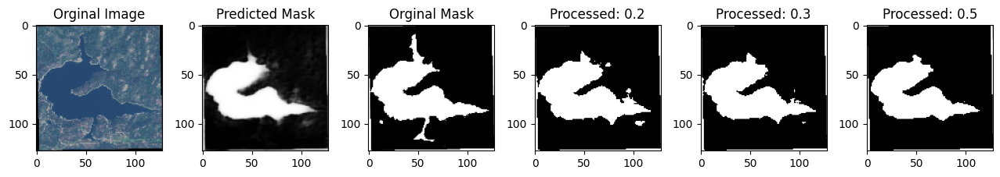

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7158 - loss: 0.3184 - val_accuracy: 0.7195 - val_loss: 0.3018
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


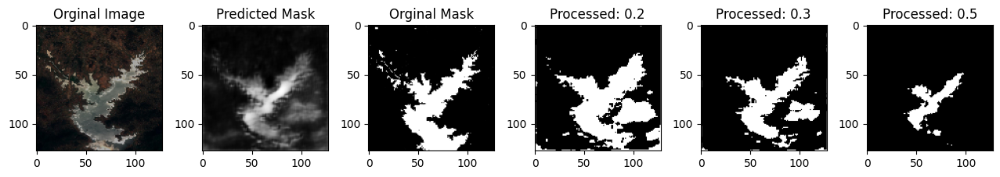

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.7231 - loss: 0.2949 - val_accuracy: 0.7179 - val_loss: 0.3165
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


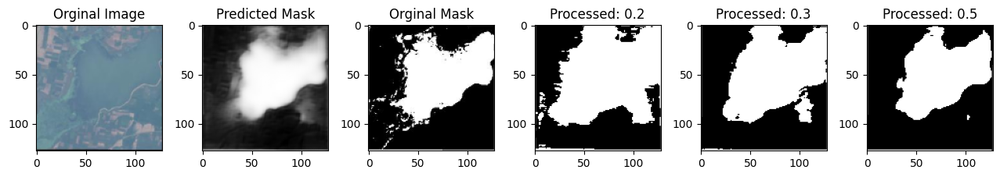

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.7145 - loss: 0.3058 - val_accuracy: 0.7186 - val_loss: 0.3058
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


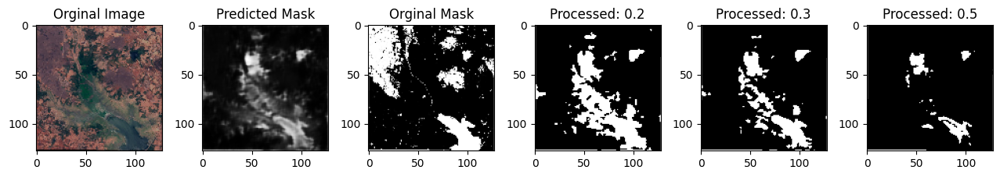

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7273 - loss: 0.2950 - val_accuracy: 0.7217 - val_loss: 0.2972
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


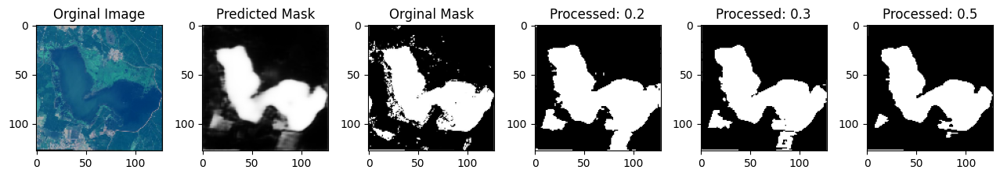

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.7315 - loss: 0.2822 - val_accuracy: 0.7278 - val_loss: 0.2838
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


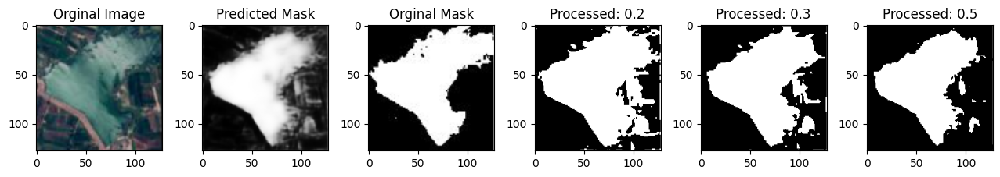

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.7288 - loss: 0.2767 - val_accuracy: 0.7289 - val_loss: 0.2748
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


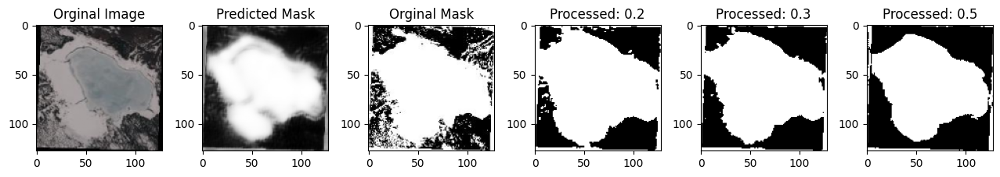

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7331 - loss: 0.2646 - val_accuracy: 0.7287 - val_loss: 0.2781
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


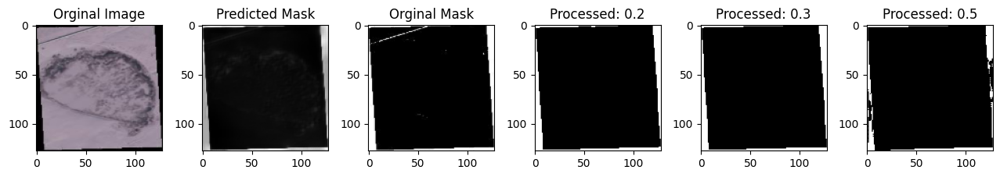

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.7380 - loss: 0.2546 - val_accuracy: 0.7261 - val_loss: 0.2814
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


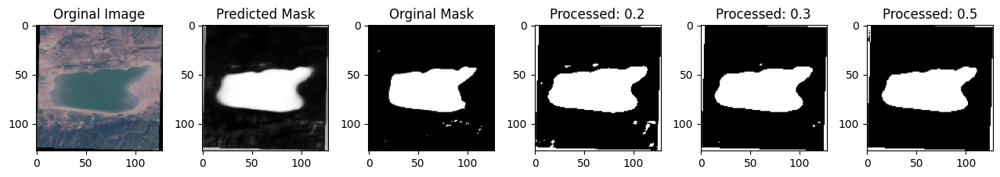

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 0.7375 - loss: 0.2617 - val_accuracy: 0.7313 - val_loss: 0.2738
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


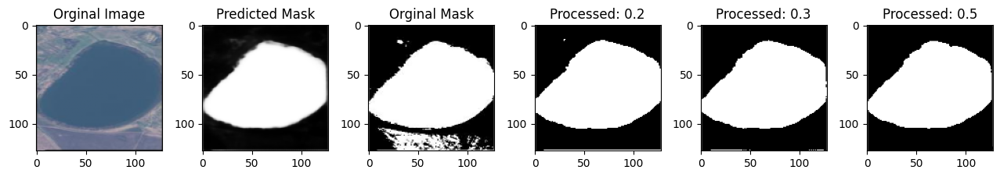

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7329 - loss: 0.2612 - val_accuracy: 0.7305 - val_loss: 0.2750
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


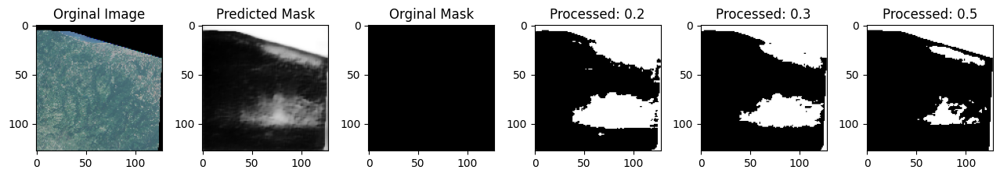

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7315 - loss: 0.2684 - val_accuracy: 0.7307 - val_loss: 0.2765
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


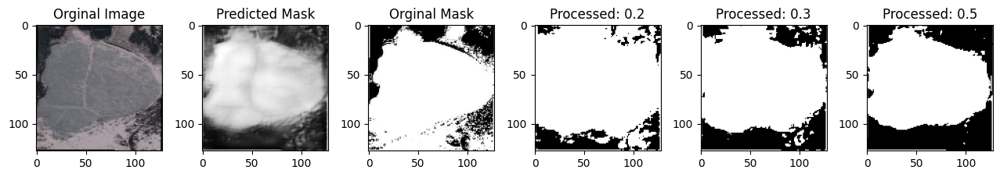

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.7319 - loss: 0.2670 - val_accuracy: 0.7324 - val_loss: 0.2635
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


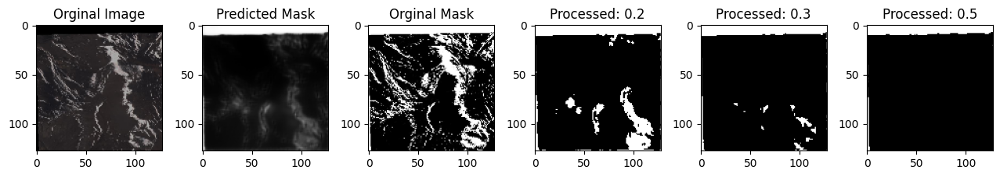

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.7330 - loss: 0.2557 - val_accuracy: 0.7344 - val_loss: 0.2701
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


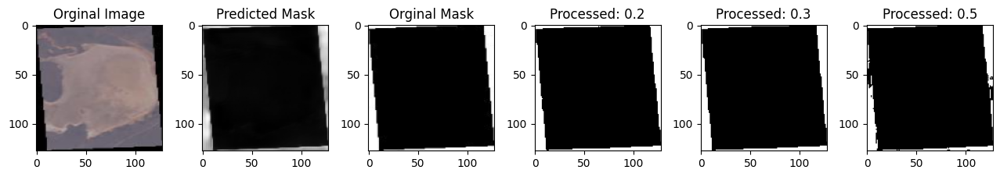

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.7381 - loss: 0.2492 - val_accuracy: 0.7350 - val_loss: 0.2659
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


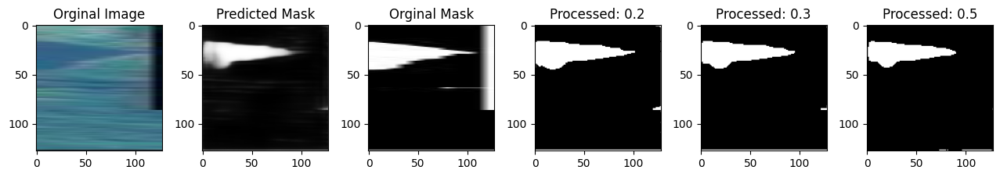

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.7401 - loss: 0.2441 - val_accuracy: 0.7387 - val_loss: 0.2625
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


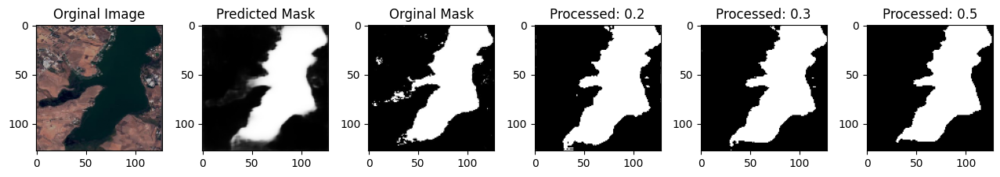

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.7356 - loss: 0.2456 - val_accuracy: 0.7360 - val_loss: 0.2579
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


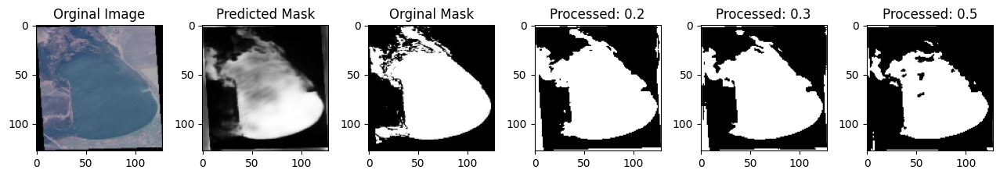

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.7436 - loss: 0.2452 - val_accuracy: 0.7337 - val_loss: 0.2863
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


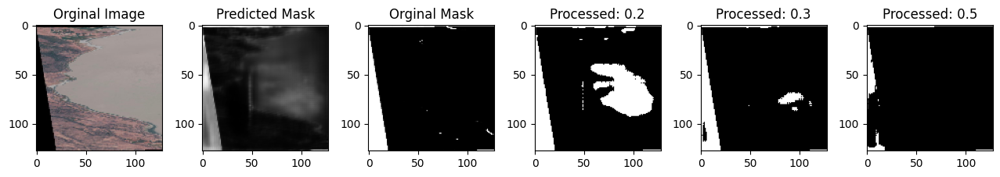

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 0.7375 - loss: 0.2609 - val_accuracy: 0.7329 - val_loss: 0.2719
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


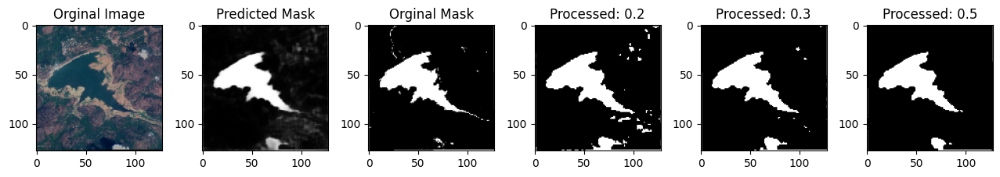

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - accuracy: 0.7351 - loss: 0.2553 - val_accuracy: 0.7344 - val_loss: 0.2594
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


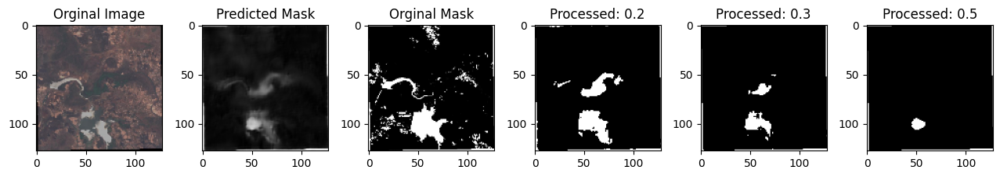

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - accuracy: 0.7383 - loss: 0.2477 - val_accuracy: 0.7378 - val_loss: 0.2529
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


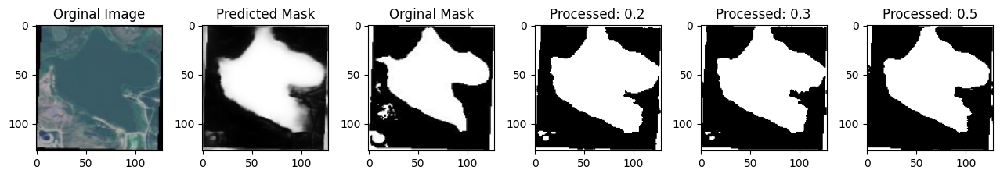

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.7388 - loss: 0.2388 - val_accuracy: 0.7390 - val_loss: 0.2598
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


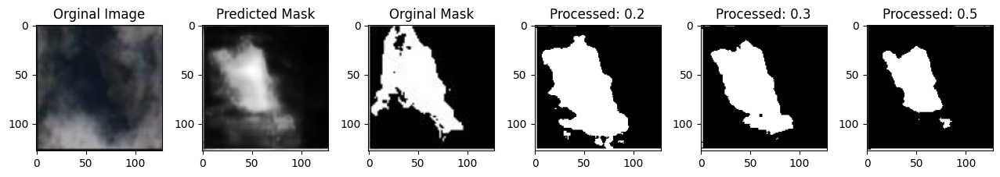

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.7420 - loss: 0.2385 - val_accuracy: 0.7377 - val_loss: 0.2678
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


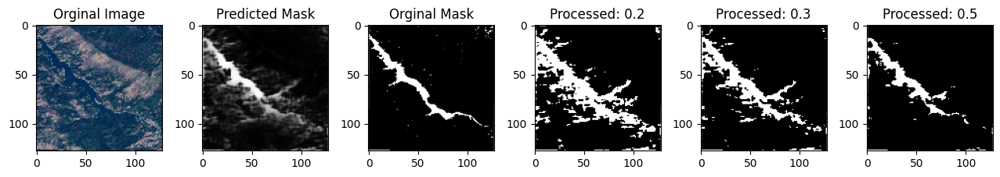

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7346 - loss: 0.2520 - val_accuracy: 0.7429 - val_loss: 0.2452
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


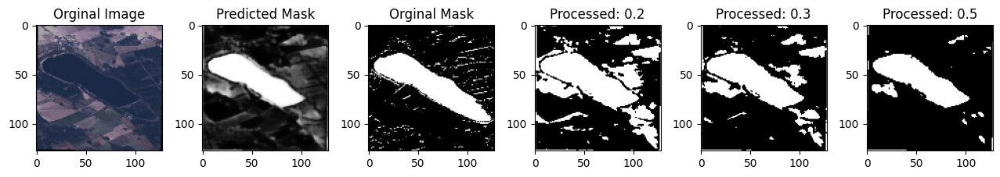

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - accuracy: 0.7480 - loss: 0.2259 - val_accuracy: 0.7360 - val_loss: 0.2540
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


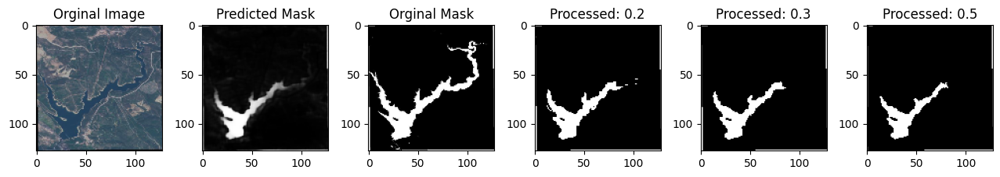

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7425 - loss: 0.2433 - val_accuracy: 0.7405 - val_loss: 0.2636
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


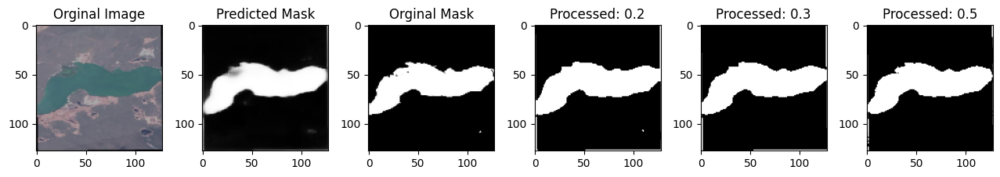

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 0.7435 - loss: 0.2324 - val_accuracy: 0.7409 - val_loss: 0.2539
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


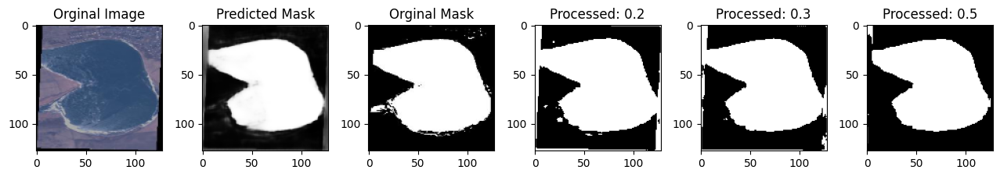

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.7403 - loss: 0.2461 - val_accuracy: 0.7333 - val_loss: 0.2854
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


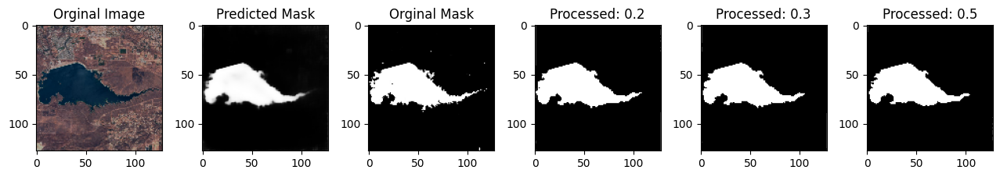

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.7386 - loss: 0.2546 - val_accuracy: 0.7358 - val_loss: 0.2726
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


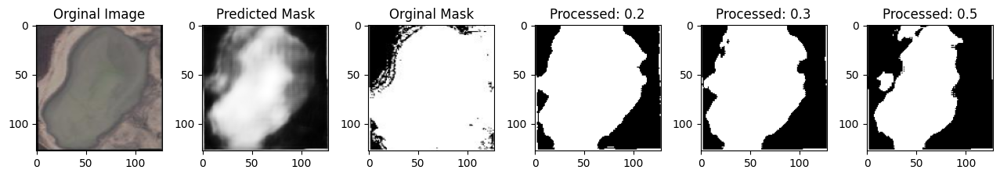

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7436 - loss: 0.2300 - val_accuracy: 0.7397 - val_loss: 0.2710
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


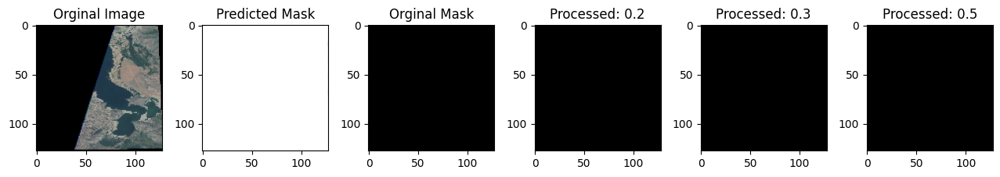

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7520 - loss: 0.2195 - val_accuracy: 0.7400 - val_loss: 0.2577
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


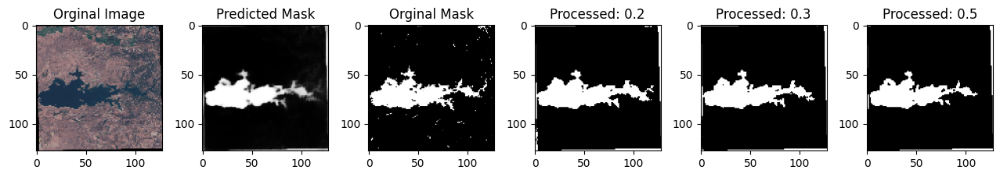

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.7465 - loss: 0.2328 - val_accuracy: 0.7357 - val_loss: 0.2693
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


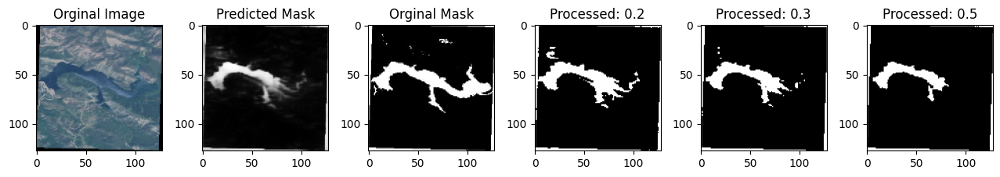

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.7418 - loss: 0.2433 - val_accuracy: 0.7430 - val_loss: 0.2496
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


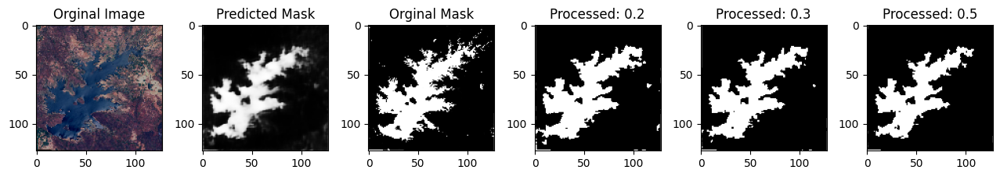

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.7399 - loss: 0.2305 - val_accuracy: 0.7415 - val_loss: 0.2473
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


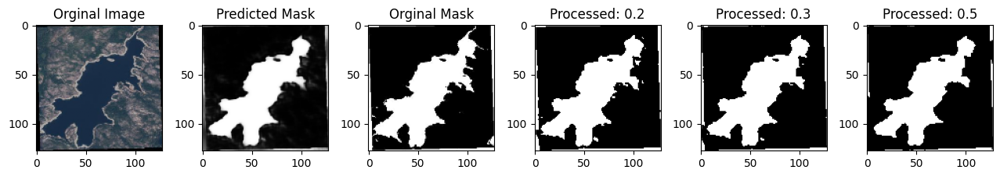

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7393 - loss: 0.2413 - val_accuracy: 0.7392 - val_loss: 0.2534
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


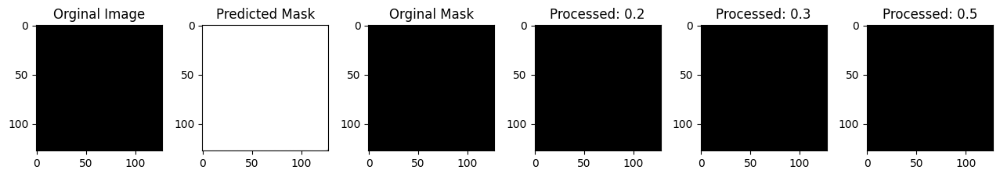

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - accuracy: 0.7421 - loss: 0.2251 - val_accuracy: 0.7397 - val_loss: 0.2629
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


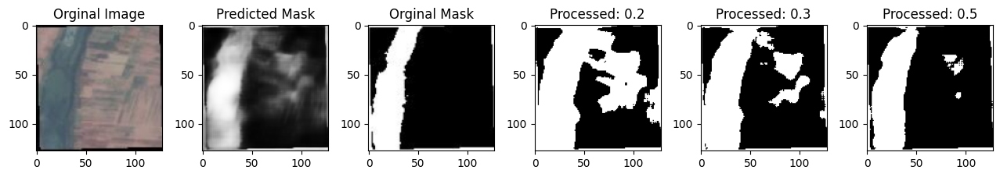

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step - accuracy: 0.7461 - loss: 0.2295 - val_accuracy: 0.7421 - val_loss: 0.2444
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


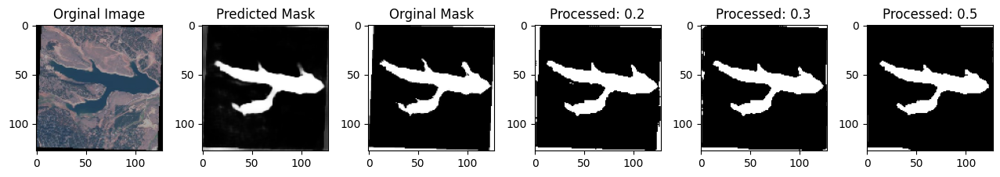

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.7492 - loss: 0.2225 - val_accuracy: 0.7348 - val_loss: 0.2705
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


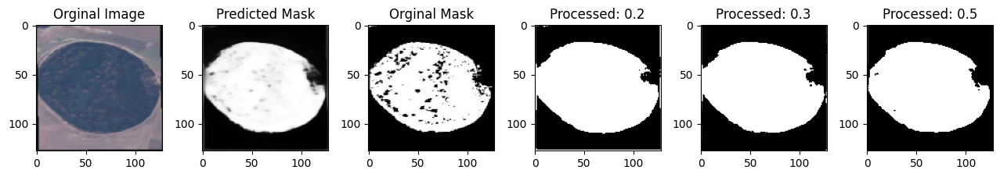

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7420 - loss: 0.2350 - val_accuracy: 0.7427 - val_loss: 0.2427
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


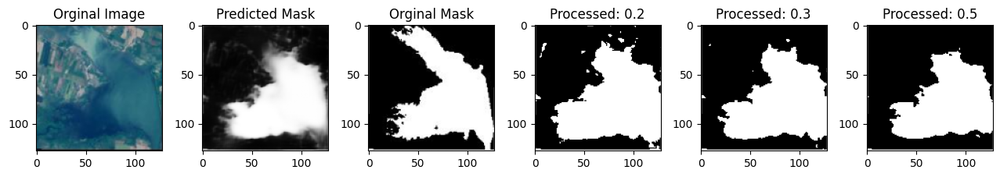

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - accuracy: 0.7326 - loss: 0.2606 - val_accuracy: 0.7294 - val_loss: 0.2727
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


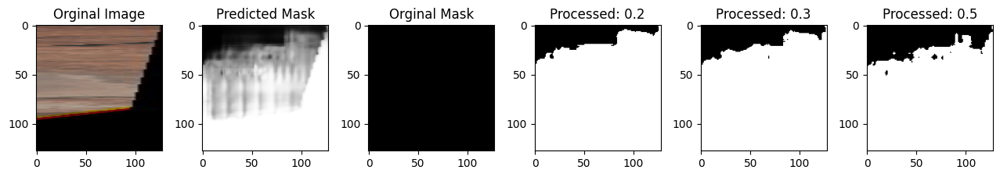

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7403 - loss: 0.2424 - val_accuracy: 0.7395 - val_loss: 0.2581
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


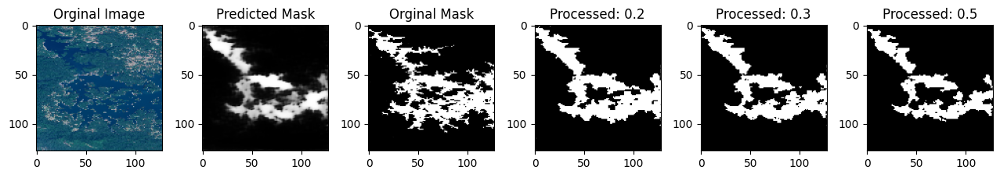

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.7488 - loss: 0.2260 - val_accuracy: 0.7361 - val_loss: 0.2634
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


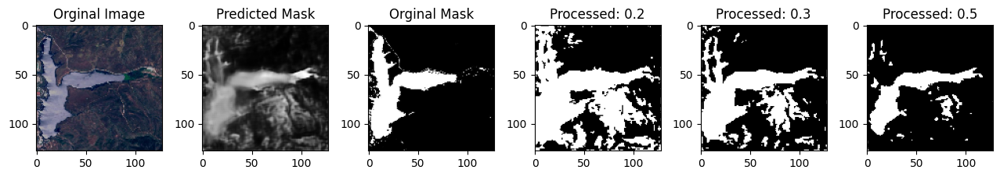

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.7471 - loss: 0.2240 - val_accuracy: 0.7352 - val_loss: 0.2608
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


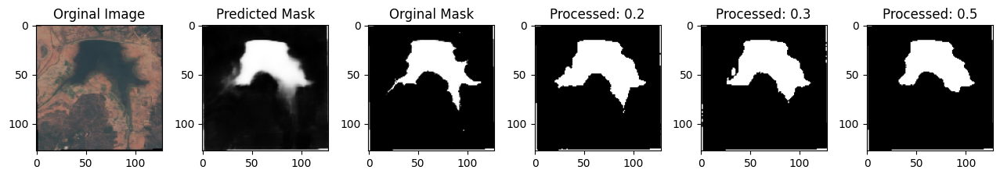

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7470 - loss: 0.2219 - val_accuracy: 0.7214 - val_loss: 0.2870
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


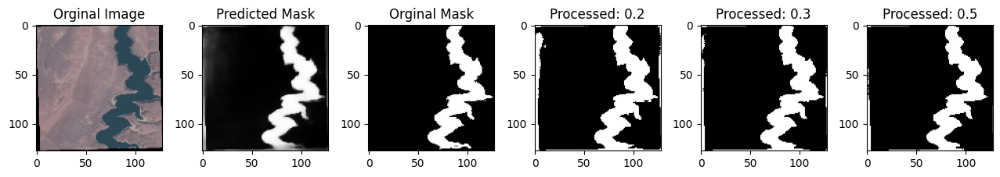

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.7359 - loss: 0.2458 - val_accuracy: 0.7386 - val_loss: 0.2508
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


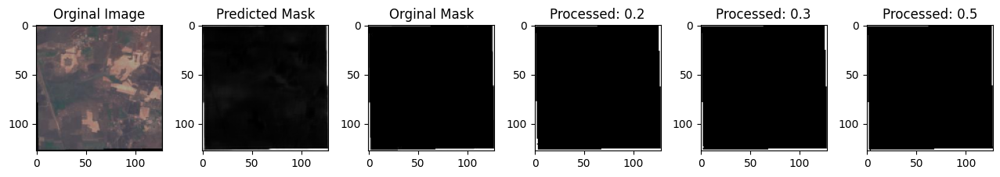

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7441 - loss: 0.2264 - val_accuracy: 0.7383 - val_loss: 0.2596
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


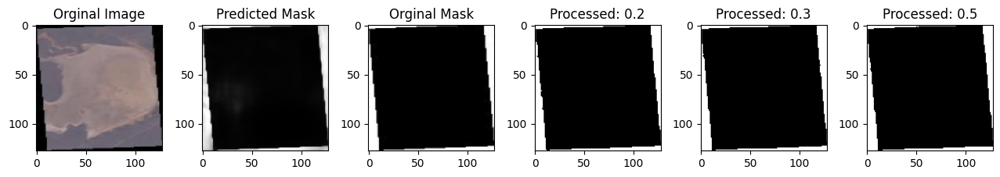

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.7457 - loss: 0.2226 - val_accuracy: 0.7392 - val_loss: 0.2555
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


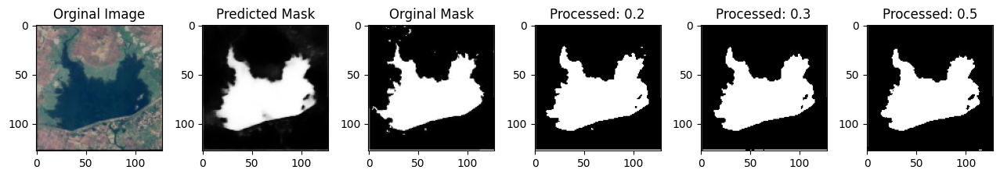

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7546 - loss: 0.2130 - val_accuracy: 0.7385 - val_loss: 0.2666
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


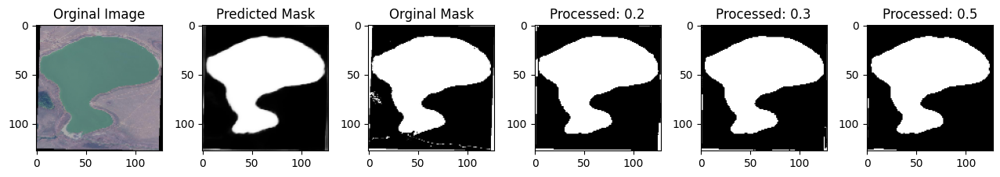

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.7451 - loss: 0.2267 - val_accuracy: 0.7387 - val_loss: 0.2663
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


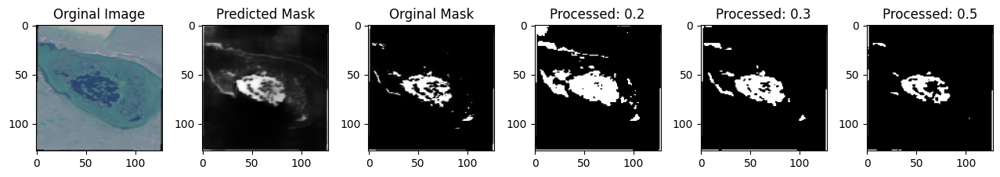

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 102ms/step - accuracy: 0.7487 - loss: 0.2161 - val_accuracy: 0.7437 - val_loss: 0.2427
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


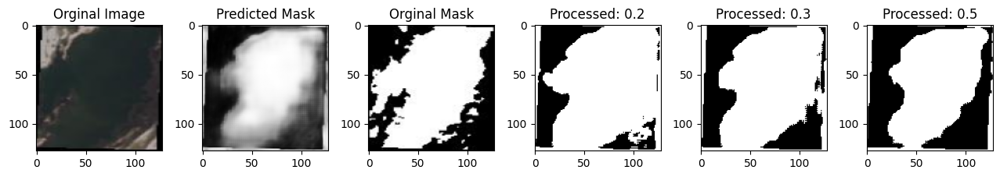

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.7542 - loss: 0.2074 - val_accuracy: 0.7417 - val_loss: 0.2462
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


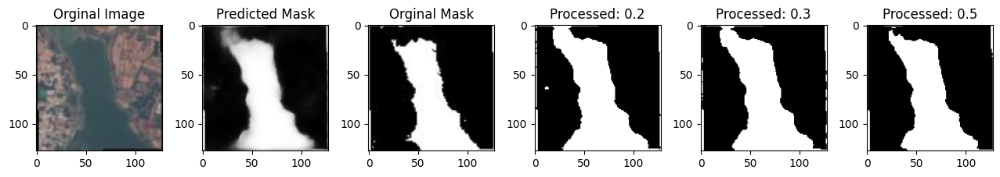

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7482 - loss: 0.2160 - val_accuracy: 0.7375 - val_loss: 0.2651
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


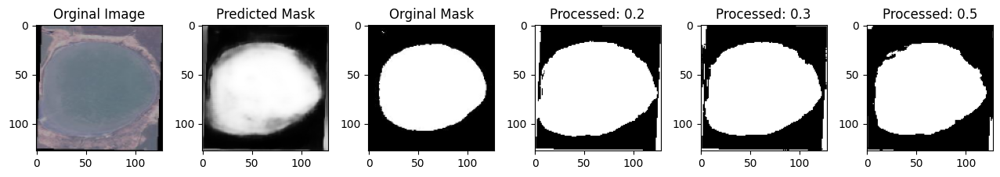

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.7517 - loss: 0.2125 - val_accuracy: 0.7416 - val_loss: 0.2532
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


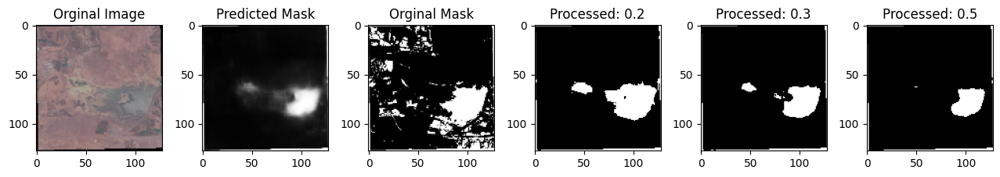

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.7539 - loss: 0.2079 - val_accuracy: 0.7415 - val_loss: 0.2478
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


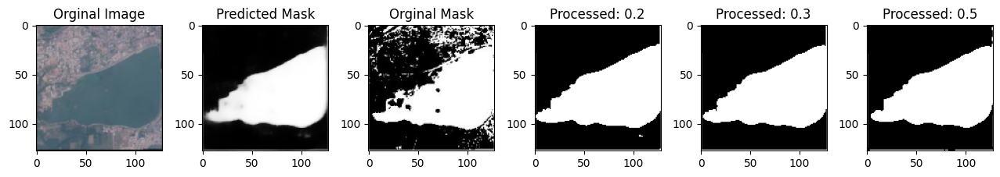

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.7564 - loss: 0.1979 - val_accuracy: 0.7430 - val_loss: 0.2573
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


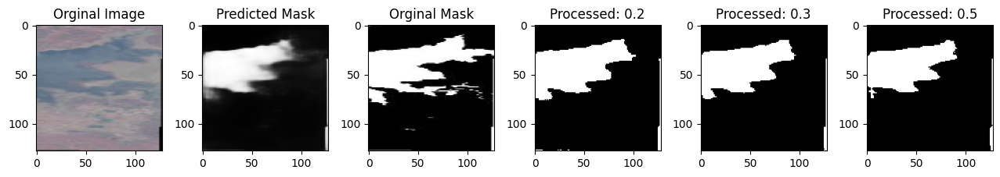

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.7509 - loss: 0.2023 - val_accuracy: 0.7448 - val_loss: 0.2373
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


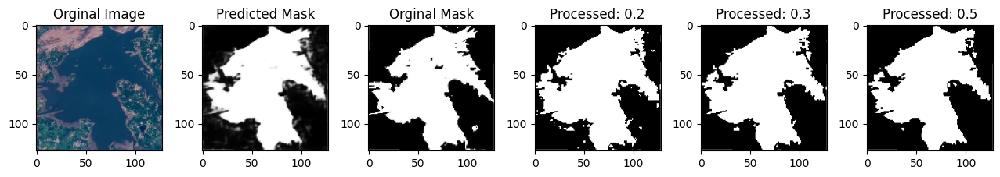

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.7420 - loss: 0.2185 - val_accuracy: 0.7389 - val_loss: 0.2515
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


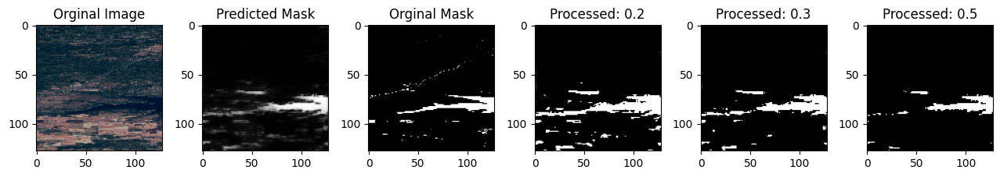

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.7487 - loss: 0.2098 - val_accuracy: 0.7430 - val_loss: 0.2490
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


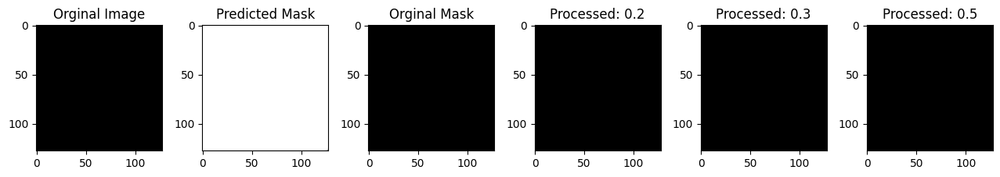

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.7503 - loss: 0.2005 - val_accuracy: 0.7420 - val_loss: 0.2507
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


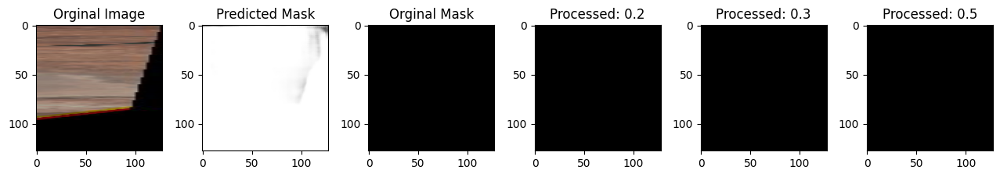

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.7544 - loss: 0.1982 - val_accuracy: 0.7445 - val_loss: 0.2489
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


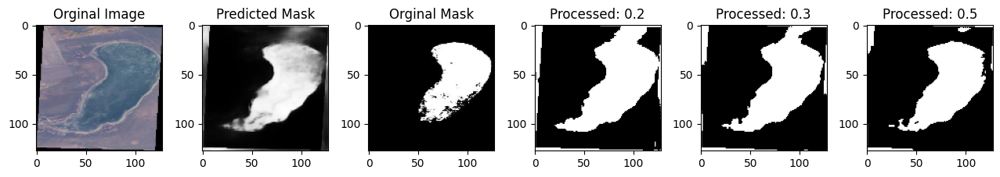

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - accuracy: 0.7540 - loss: 0.1976 - val_accuracy: 0.7385 - val_loss: 0.2672
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


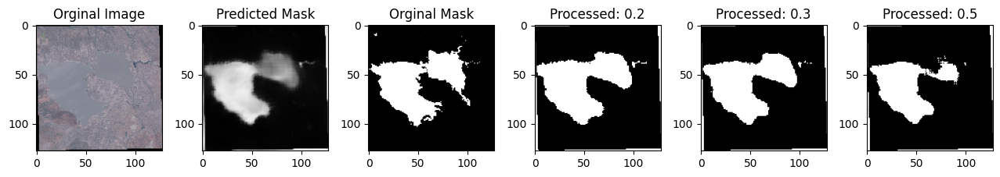

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.7529 - loss: 0.2109 - val_accuracy: 0.7439 - val_loss: 0.2628
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


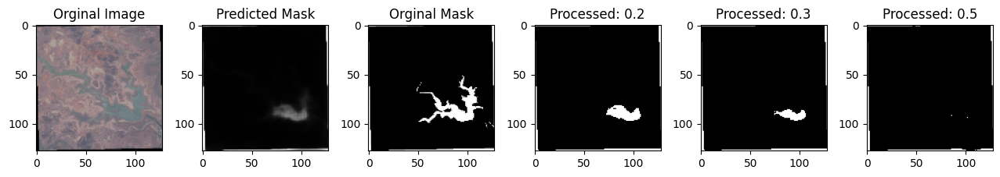

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - accuracy: 0.7519 - loss: 0.2044 - val_accuracy: 0.7406 - val_loss: 0.2669
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


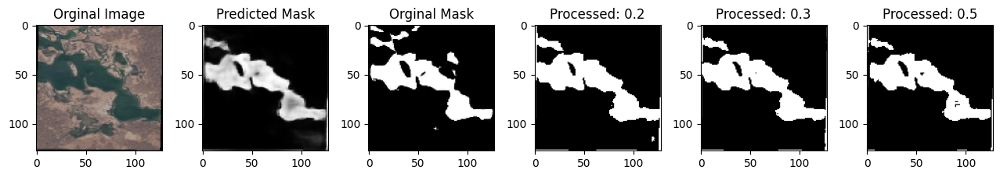

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.7544 - loss: 0.1923 - val_accuracy: 0.6957 - val_loss: 0.4273
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


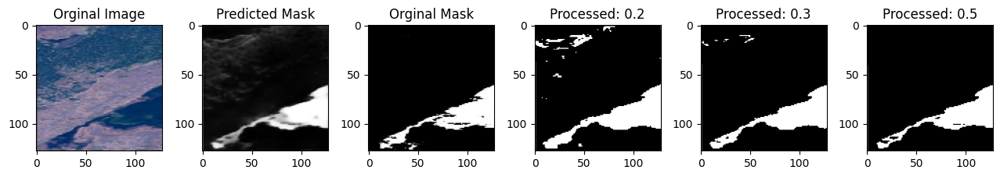

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.6906 - loss: 0.3823 - val_accuracy: 0.7212 - val_loss: 0.3223
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


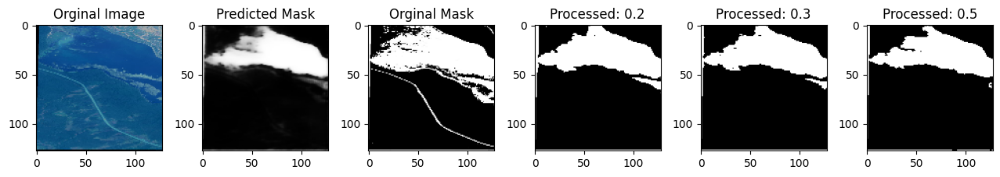

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - accuracy: 0.7301 - loss: 0.2702 - val_accuracy: 0.7272 - val_loss: 0.3038
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


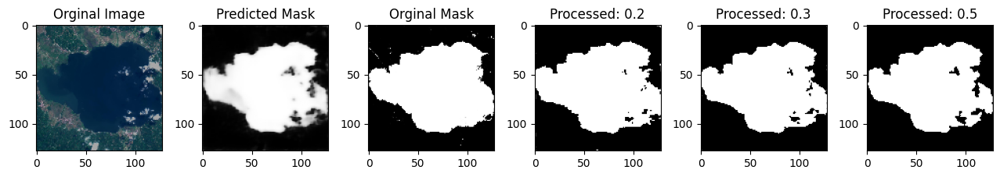

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.7370 - loss: 0.2551 - val_accuracy: 0.7224 - val_loss: 0.3225
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


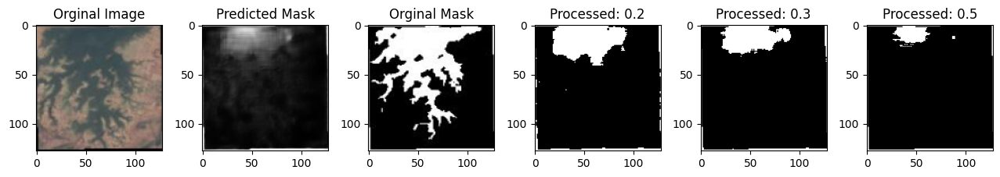

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.7430 - loss: 0.2387 - val_accuracy: 0.7372 - val_loss: 0.2559
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


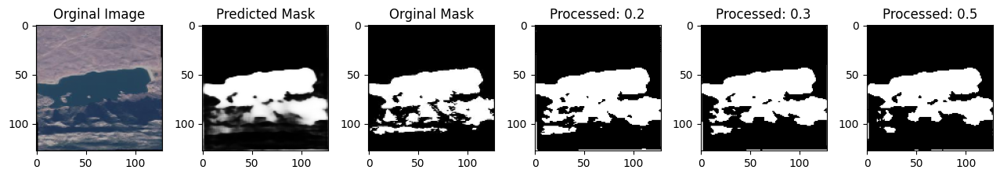

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - accuracy: 0.7410 - loss: 0.2281 - val_accuracy: 0.7429 - val_loss: 0.2607
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


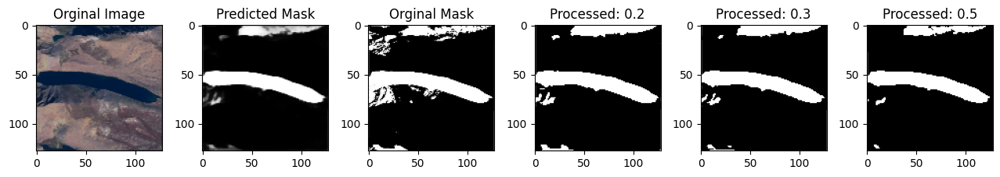

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7421 - loss: 0.2243 - val_accuracy: 0.7407 - val_loss: 0.2639
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


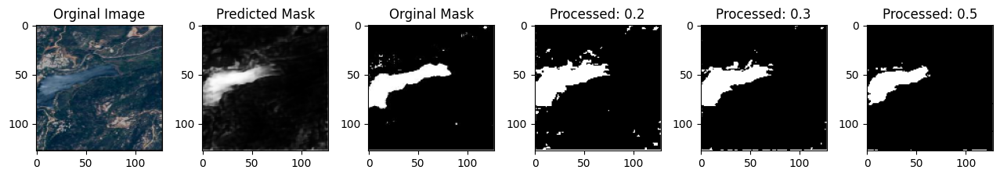

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step - accuracy: 0.7521 - loss: 0.2014 - val_accuracy: 0.7420 - val_loss: 0.2496
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


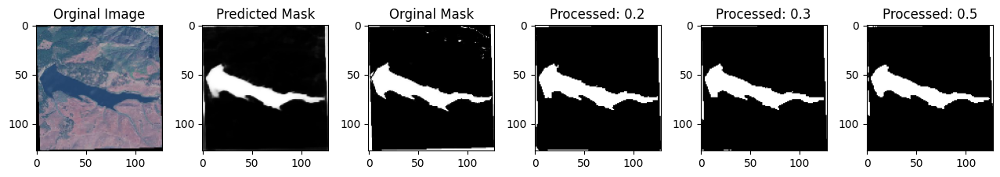

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7498 - loss: 0.2056 - val_accuracy: 0.7416 - val_loss: 0.2561
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


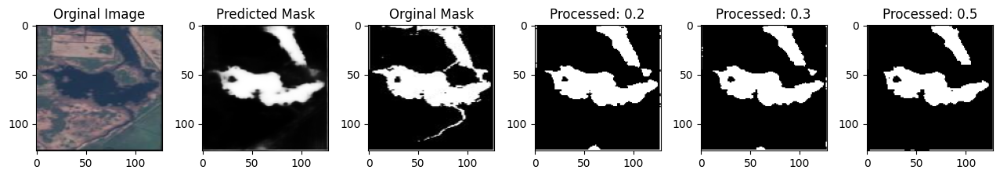

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7564 - loss: 0.1932 - val_accuracy: 0.7390 - val_loss: 0.2761
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


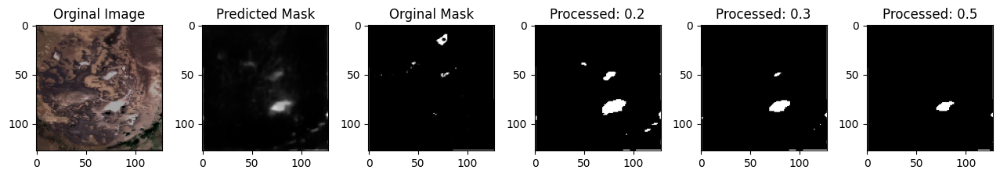

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7549 - loss: 0.1954 - val_accuracy: 0.7385 - val_loss: 0.2748
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


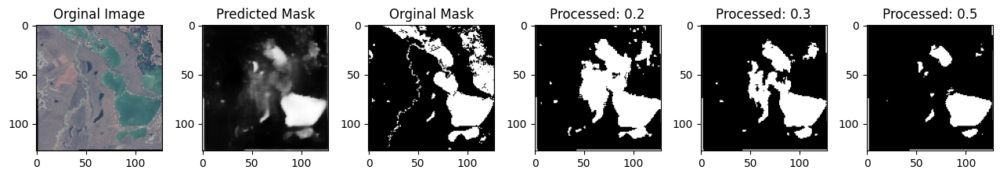

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - accuracy: 0.7495 - loss: 0.1988 - val_accuracy: 0.7366 - val_loss: 0.2617
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


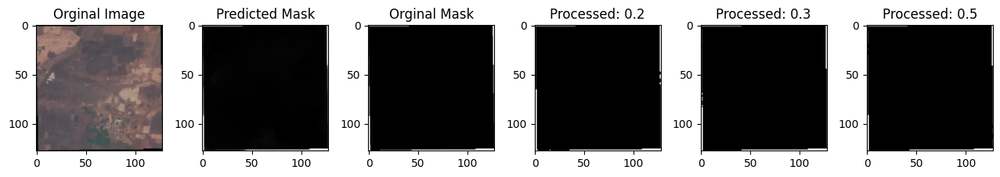

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7509 - loss: 0.2009 - val_accuracy: 0.7370 - val_loss: 0.2715
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


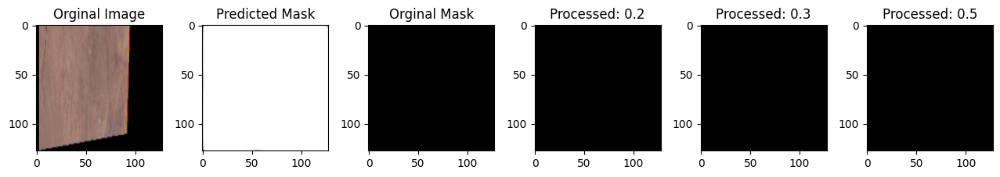

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7536 - loss: 0.1997 - val_accuracy: 0.7359 - val_loss: 0.2736
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


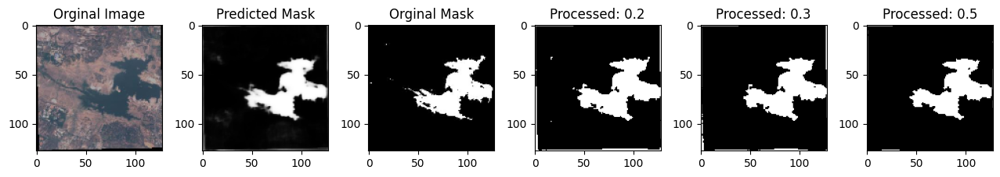

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7466 - loss: 0.2049 - val_accuracy: 0.7434 - val_loss: 0.2569
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


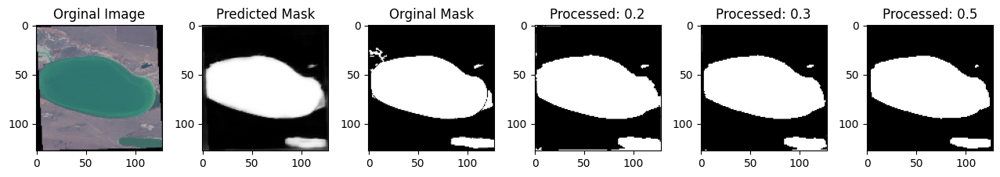

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.7584 - loss: 0.1849 - val_accuracy: 0.7393 - val_loss: 0.2605
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


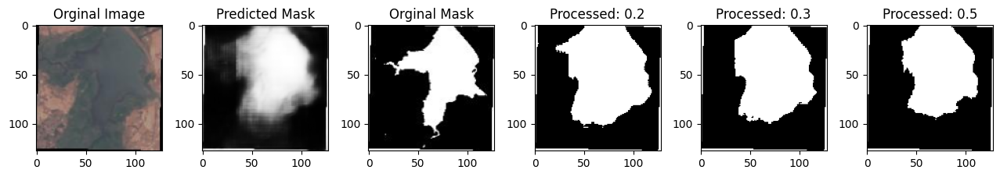

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7535 - loss: 0.1974 - val_accuracy: 0.7394 - val_loss: 0.2580
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


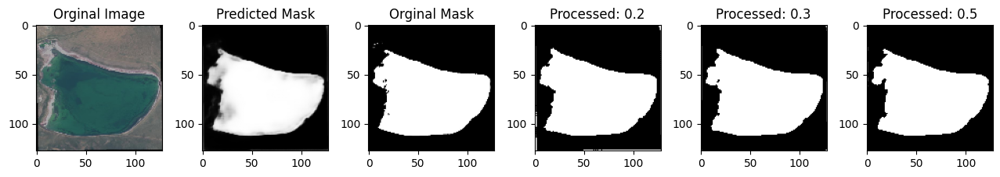

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.7583 - loss: 0.1890 - val_accuracy: 0.7444 - val_loss: 0.2570
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


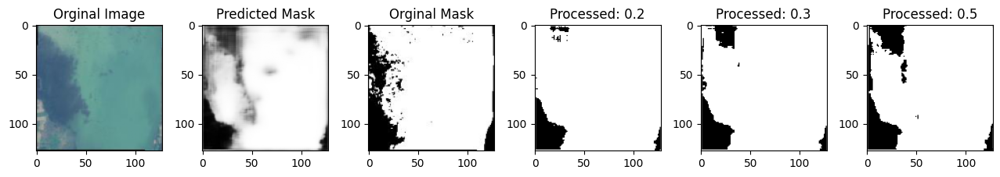

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.7597 - loss: 0.1855 - val_accuracy: 0.7457 - val_loss: 0.2472
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


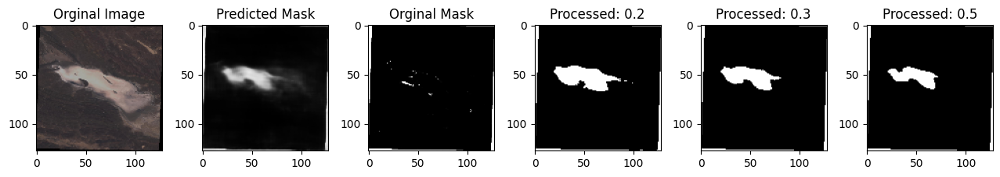

67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - accuracy: 0.7583 - loss: 0.1836 - val_accuracy: 0.7413 - val_loss: 0.2568
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


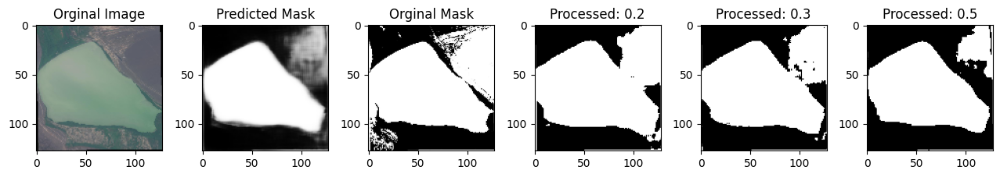

67/67 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7566 - loss: 0.1875 - val_accuracy: 0.7410 - val_loss: 0.2522


In [ ]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    validation_data=[images_test, mask_test],
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

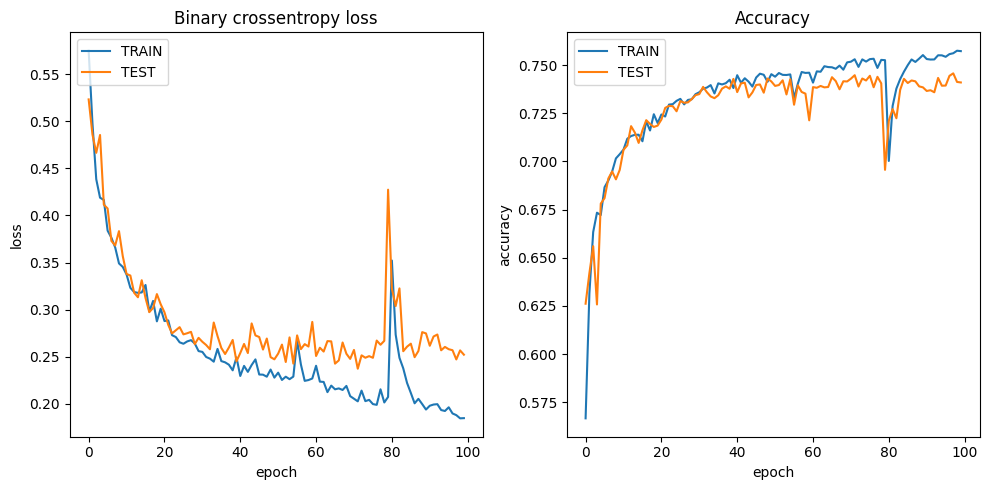

In [ ]:
plt.figure(figsize=(10,5))

# Plot loss for each epoch
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label="Train loss")
plt.plot(history.history['val_loss'], label="Test loss")
plt.title('Binary crossentropy loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

# Plot accuracy for each epoch
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label="Train accuracy")
plt.plot(history.history['val_accuracy'], label="Test accuracy")
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

plt.tight_layout()
plt.show()

In [ ]:
def calculate_iou(y_true, y_pred):
    """Calculates the Intersection over Union (IoU) score."""
    intersection = np.logical_and(y_true > 0, y_pred > 0)
    union = np.logical_or(y_true > 0, y_pred > 0)
    if np.sum(union) == 0:
        return 1.0 if np.sum(intersection) == 0 else 0.0
    iou = np.sum(intersection) / np.sum(union)
    return iou

In [ ]:
def calculate_average_iou(mask_test, predictions, threshold=0.5):

    iou_scores = []
    for i in range(len(mask_test)):
        mask = mask_test[i].reshape(128, 128)
        predicted_mask = predictions[i].reshape(128, 128)
        threshold_mask = mask_threshold(predicted_mask, threshold=threshold)
        iou = calculate_iou(mask, threshold_mask)
        iou_scores.append(iou)
    return np.mean(iou_scores)

In [ ]:
# Make predictions
predictions = model.predict(images_test)


23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step


In [ ]:

  average_iou = calculate_average_iou(mask_test, predictions, threshold=0.1)
  print(f"\nAverage IoU score: {average_iou:.4f}")


In [ ]:
def plot_results(threshold=0.5):
    k = np.random.randint(len(images_test))
    original_image = images_test[k]
    mask = mask_test[k].reshape(128, 128)
    mask = mask_threshold(mask, threshold=threshold)
    predicted_mask = predictions[k].reshape(128, 128)
    threshold_mask = mask_threshold(predicted_mask, threshold=threshold)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(original_image);
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(mask, cmap='gray');
    plt.title('Original Mask')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(predicted_mask, cmap='gray');
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(threshold_mask, cmap='gray');
    plt.title(f'Predicted Mask with cutoff={threshold}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

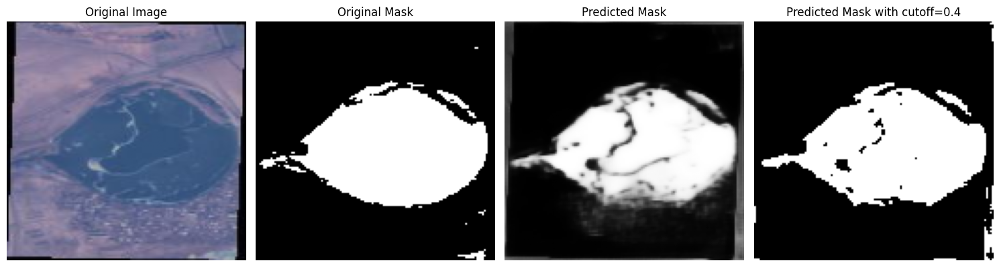

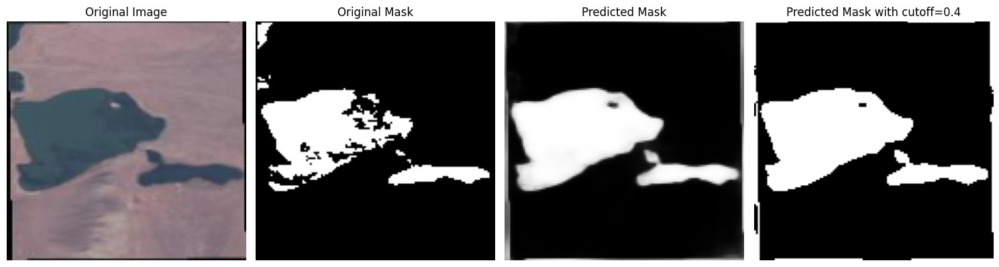

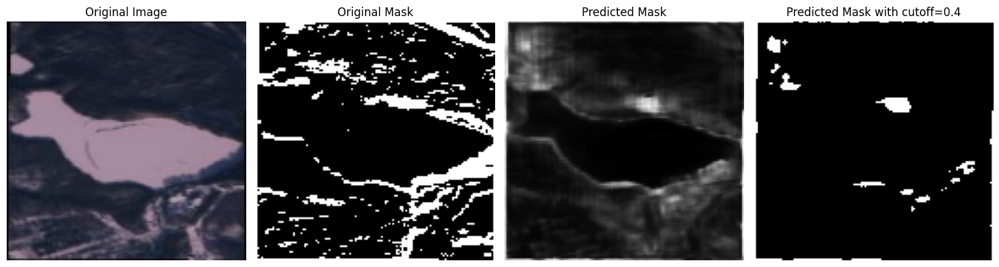

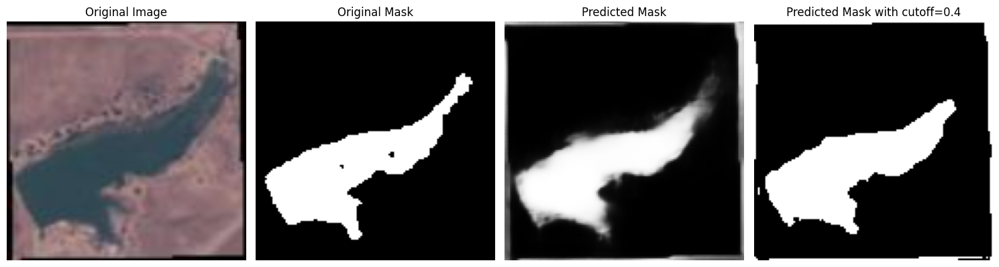

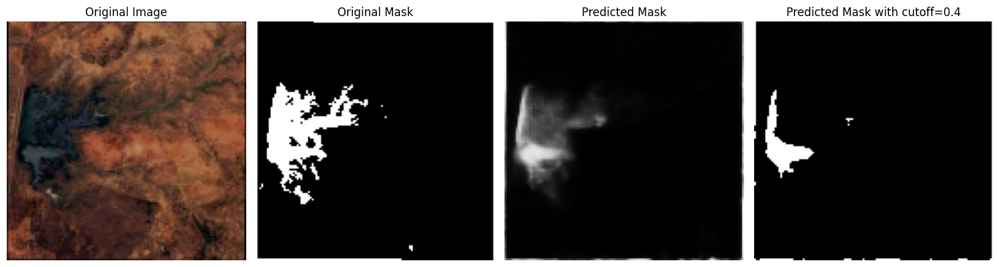

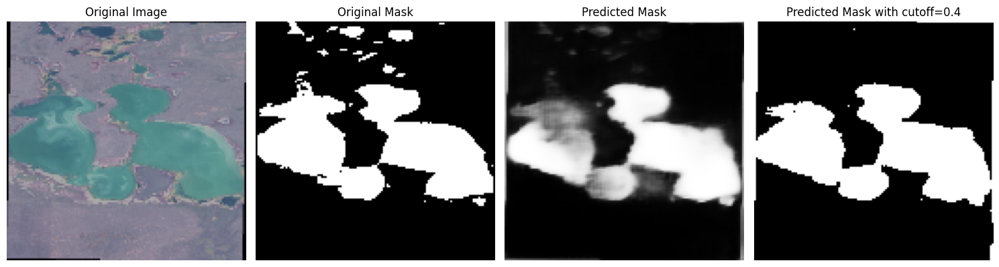

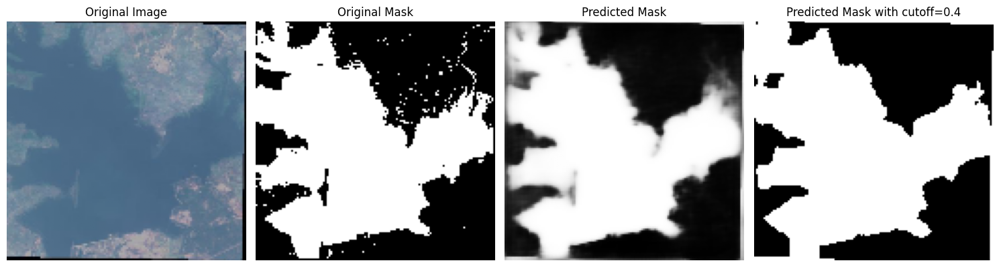

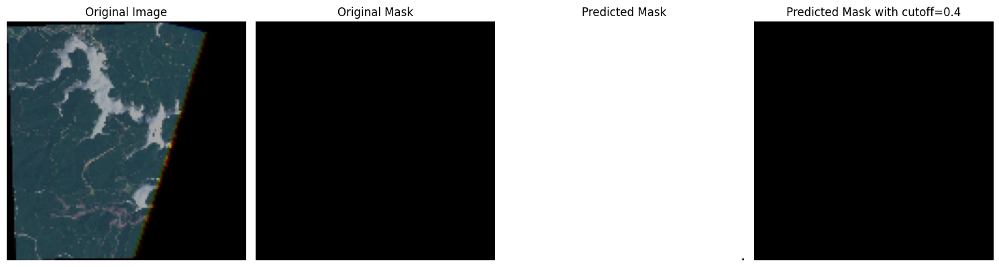

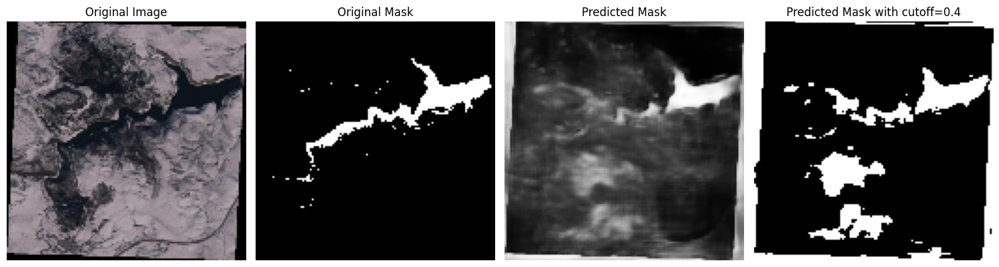

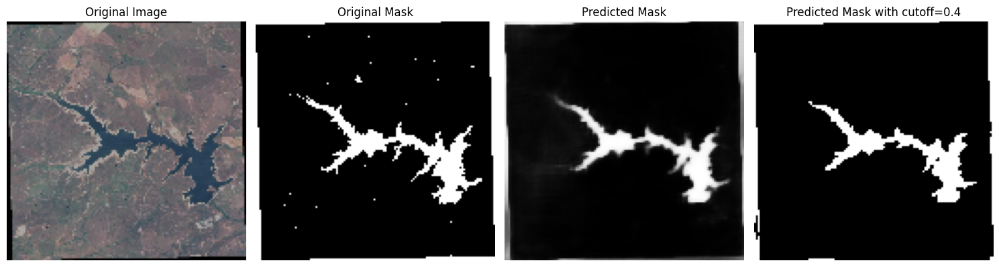

In [ ]:

# Plot results on test data
for i in range(10):
  plot_results(threshold=0.4)

In [ ]:
model.save('/content/drive/MyDrive/23MCA0304_Dissertation_II/Model/water_body_detection_model_1.keras')

In [ ]:
from tensorflow import keras
model = keras.models.load_model('/content/drive/MyDrive/23MCA0304_Dissertation_II/Model/water_body_detection_model_1.keras')


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 48 variables whereas the saved optimizer has 94 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
